In [1]:
import sys
print(sys.path)

['E:\\学习\\5药物研发\\靶点发现\\下游任务\\单细胞\\跨物种\\came\\CAME_3\\analysis\\jupyterlab\\1testis', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\python39.zip', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\DLLs', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib', 'C:\\Users\\10360\\anaconda3\\envs\\py39', '', 'C:\\Users\\10360\\AppData\\Roaming\\Python\\Python39\\site-packages', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\win32', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\win32\\lib', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\Pythonwin']


In [2]:
import os
import time
import torch
import shutil
import warnings
import argparse
import importlib
import scanpy as sc

import pandas as pd
import numpy as mp

from CAMEX.base import Dataset
from CAMEX.trainer import Trainer

warnings.filterwarnings("ignore")

In [3]:
from params import PARAMS

In [4]:
sc.settings.set_figure_params(facecolor='white', frameon=False, dpi=300, dpi_save=300, figsize=(4, 4))

In [5]:
def clear_fig(fig):
    if fig:
        fig.axes[0].set_xlabel(None)
        fig.axes[0].set_ylabel(None)
        fig.tight_layout()
    else:
        pass
    return fig

In [6]:
# path = './'

In [7]:
time_start = time.strftime("%Y-%m-%d-%H-%M-%S")
# time_start = '2024-03-13-21-23-12'
log_path = f'./log/{time_start}/'
for k, v in PARAMS.items():
    v['time_start'] = time_start
    v['log_path'] = log_path
print(log_path)

./log/2024-03-18-21-59-07/


In [8]:
os.makedirs(log_path, exist_ok=True)
shutil.copy('params.py', log_path + 'params_current.py')
print(f'time: {time_start}')

time: 2024-03-18-21-59-07


In [9]:
#  —————————————————————————————————— 1 preprocess
print('start preprocess')
dataset = Dataset(**PARAMS['preprocess'])
# torch.save(dataset, log_path + 'dataset_preprocessed.pt')
# dataset = torch.load(f'{args.path}/log/2023-06-06-09-02-45/dataset_preprocessed.pt')
adata_CAMEX = dataset.adata_whole
dgl_data = dataset.dgl_data

start preprocess
               raw-testis-human-Murat: reference  raw-testis-chimpanzee-Murat: query  raw-testis-bonobo-Murat: query  raw-testis-gorilla-Murat: query  raw-testis-gibbon-Murat: query  raw-testis-macaque-Murat: query  raw-testis-marmoset-Murat: query  raw-testis-mouse-Murat: query  raw-testis-opossum-Murat: query  raw-testis-platypus-Murat: query  raw-testis-chicken-Murat: query
spermatids                                  6359                                6044                            5452                             3144                            2050                             2794                              3266                           2629                             3475                            4500.0                             3501
Spermatocytes                               3878                                3210                            2802                             1640                            1932                             1781         

In [10]:
print('start train')
trainer = Trainer(adata_CAMEX, dgl_data, **PARAMS['train'])

start train


In [11]:
trainer.pretrain()

--------------------------------------------- pretrain ---------------------------------------------
epoch: 0, loss: 165.64448650618246
epoch: 1, loss: 76.88984135219029
epoch: 2, loss: 76.0344670231181
epoch: 3, loss: 75.5950889300583
epoch: 4, loss: 75.28206370647689
epoch: 5, loss: 75.03610292592442
epoch: 6, loss: 74.83806707625999
epoch: 7, loss: 74.72233283250851
epoch: 8, loss: 74.48918381310943
epoch: 9, loss: 74.3315890893004


In [12]:
adata_CAMEX.write_h5ad(log_path + 'adata_CAMEX.h5ad', compression='gzip')

# analysis

In [7]:
log_path = './log/2024-03-18-21-59-07/'

In [8]:
log_path

'./log/2024-03-18-21-59-07/'

In [9]:
adata_CAMEX = sc.read_h5ad(log_path + 'adata_CAMEX.h5ad')
adata_CAMEX

AnnData object with n_obs × n_vars = 96464 × 2000
    obs: 'sample_batch', 'cell_type', 'cell_ontology_class', 'batch', 'n_genes_by_counts', 'total_counts', 'cell_ontology_class_num', 'cell_class', 'cell_class_num'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'cell_type', 'data_order', 'dataset_description', 'dataset_type', 'hvg', 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca', 'cell_pretrain_hidden'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [10]:
adata_CAMEX.obsm['cell_pretrain_hidden'].shape

(96464, 128)

In [11]:
sc.pp.neighbors(adata_CAMEX, use_rep='cell_pretrain_hidden')

In [12]:
sc.tl.umap(adata_CAMEX)

In [13]:
sc.tl.leiden(adata_CAMEX, resolution=0.2)

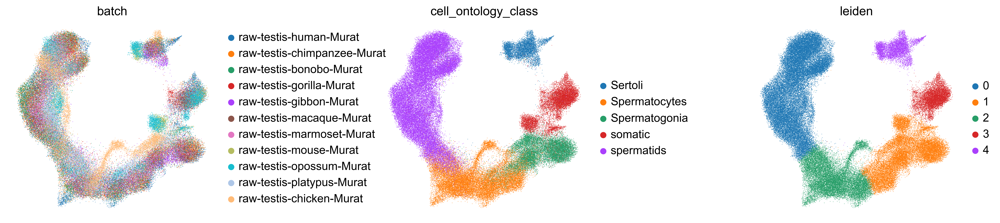

In [14]:
sc.pl.umap(adata_CAMEX, color=['batch', 'cell_ontology_class', 'leiden'], wspace=0.6)